# Importing packages

In [3]:
import cv2
import plotly
import numpy as np
from scipy import signal
import matplotlib.pyplot as plt
from IPython.display import display, clear_output

# Initialzing variables

In [2]:
input_path = "D:\Academics\CMI\MSC_4th_sem\CV\My_work\Assignment_1\Data\Input"
output_path = "D:\Academics\CMI\MSC_4th_sem\CV\My_work\Assignment_1\Data\Output"

# Problem

## 1.

#### Defining the function

In [3]:
def col2gray(input_path, image_name, jpg = False):
    # Code to read the image based on its format. jpg or png.
    if jpg:
        image = cv2.imread(input_path + "\\" + image_name + ".jpg")
    else:
        image = cv2.imread(input_path + "\\" + image_name + ".png")
        
    # Converting color to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
   
    # showing the image
    f, axarr = plt.subplots(1, 2, figsize=(12, 12))
    axarr[0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axarr[1].imshow(cv2.cvtColor(gray_image, cv2.COLOR_BGR2RGB))
    
    # Storing the image in the given folder
    cv2.imwrite(output_path + "\\" + "gray_" + image_name + ".png", gray_image)

#### Testing function with examples

##### Example 1

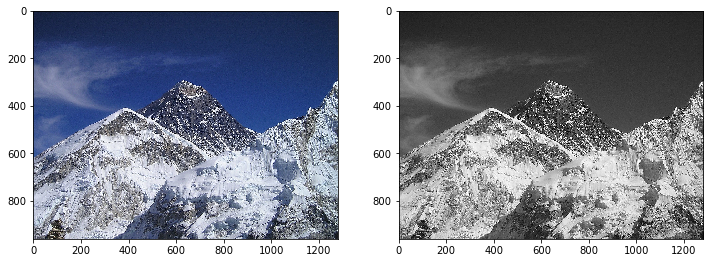

In [4]:
col2gray(input_path, "hill")

##### Example 2

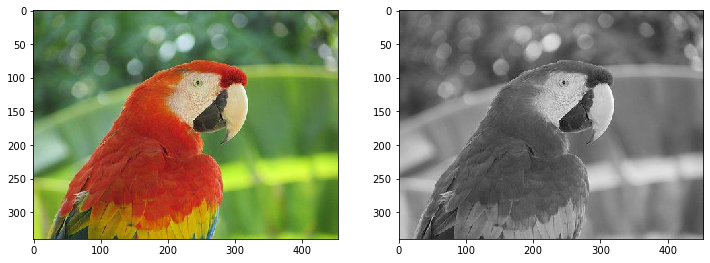

In [5]:
col2gray(input_path, "parrot")

## 2.

#### Defining the function

In [6]:
def cvtdouble(input_path, image_name, jpg = False):
    
    if jpg:
        image = cv2.imread(input_path + "\\" + image_name + ".jpg")
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    else:
        image = cv2.imread(input_path + "\\" + image_name + ".png")
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    plt.imshow(image)
    plt.show()
        
    print("There are {} bits per pixel" .format(str(image.dtype)[-1]))
    print("\n")
    print("Data type is           ::", image.dtype)
    print("Height of the image is :: {} pixel" .format(image.shape[0]))
    print("Width of the image is  :: {} pixel" .format(image.shape[1]))
    
    # (a)  Converting the image into a double-precision array.
    image = image.astype(np.double)
    
    # (b)  Linearizaton of the image
    min_pix = np.min(image)
    max_pix = np.max(image)
    
    image = (image - min_pix)/(max_pix - min_pix)
    print("\n")
    print("Image after linearization")
    plt.imshow(image)
    plt.show()
    
    # (c)  Multiplying with 255
    image = image * 255
    print("\n")
    print("Multiplying with 255")
    plt.imshow(image.astype('uint8'))
    plt.show()   
    
    return(image)

#### Testing function with examples

##### Example 1

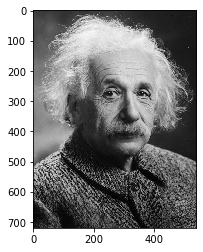

There are 8 bits per pixel


Data type is           :: uint8
Height of the image is :: 720 pixel
Width of the image is  :: 540 pixel


Image after linearization


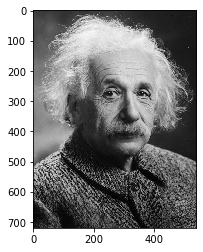



Multiplying with 255


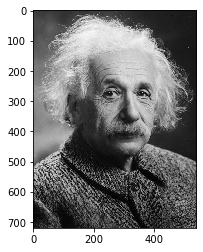

In [7]:
image = cvtdouble(input_path, "einstein", jpg = True)

##### Example 2

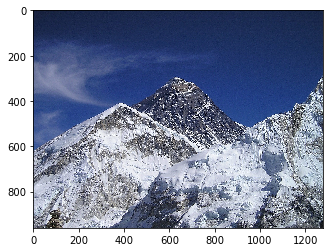

There are 8 bits per pixel


Data type is           :: uint8
Height of the image is :: 960 pixel
Width of the image is  :: 1280 pixel


Image after linearization


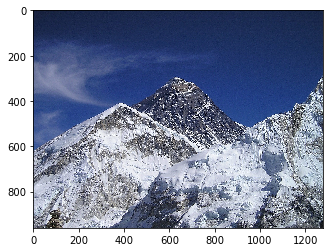



Multiplying with 255


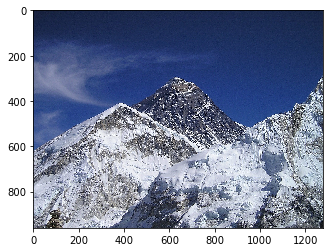

In [8]:
image = cvtdouble(input_path, "hill")

(c) They are giving same images

# 3.

##### **The formula for zero padding is given by:**
> ##### Let f be the M x N image matrix. Let fhat be the padded image of size > $M_{2}$ x $N_{2}$. Then for $1<=i<=M_{2}$ and $1<=j<=N_{2}$,
> ##### $\hat{f}(i,j) = f(i,j)$
> $\ \ \ \ \ if\ \ \ (M_{2}-M)/2+1 <= i <= M+(M_{2}-M)/2$ $\>$$\>$$\>$and$\>$$\>$$\>$ $(N_{2}-N)/2+1 <= j <= N+(N_{2}-N)/2$
> ##### $\hat{f}(i,j) = 0$
> $\ \ \ \ \ otherwise$
>##### This is for all three channels in an RGB image and also for the single channel in a black and white image.

________________________________________________________________________________

##### **The formula for constant padding is:** 
> ##### the same as above except for the fact that it has k(a constant value) instead of the zero in the otherwise case.

> ##### $\hat{f}(i,j) = c, 0 <= c < 256$

________________________________________________________________________________

##### **The formula for clamp padding is given by:**
> ##### $\hat{f}(i, j) = f(k,l)$
> $\ \ \ \ \ k = max(0, min(M − 1, i)), l = max(0, min(N − 1, j))$

________________________________________________________________________________

##### **The formula for mirror padding is given by:**
> $\hat{f}(i,j) = f(|i|,|j|)$
> ##### $\ \ \ \ \ if\ \ \ i<=M-1, j<=N-1$ 
> $\hat{f}(i,j) = f(2M - i -1,|j|)$
> ##### $\ \ \ \ \ if\ \ \ i>M-1,j<=N-1$
> $\hat{f}(i,j) = f(|i|, 2N-j-1)$
> ##### $\ \ \ \ \ if\ \ \ i<=M-1,j>N-1$
> $\hat{f}(i,j) = f(2M-i-1,2N-j-1)$
> ##### $\ \ \ \ \ if\ \ \ i>M-1, j>N-1$

# 4.

#### Defining the function

In [8]:
def padding_image(image, Type = "zero", pad_size = [5, 5, 5, 5]):

    pad_h_top, pad_h_bottom, pad_w_left, pad_w_right = pad_size


    if Type == "zero":
        padded_image = cv2.copyMakeBorder(image, pad_h_top, pad_h_bottom, pad_w_left, pad_w_right, cv2.BORDER_CONSTANT, value = (0, 0, 0))
    elif Type == "constant":
        color = list(int(i) for i in list(input("Enter color scale, Three integer between 0 and 255 with space in between:: ").split())[: 3])
        padded_image = cv2.copyMakeBorder(image, pad_h_top, pad_h_bottom, pad_w_left, pad_w_right, cv2.BORDER_CONSTANT, value = color)
    elif Type == "clamp":
        padded_image = cv2.copyMakeBorder(image, pad_h_top, pad_h_bottom, pad_w_left, pad_w_right, cv2.BORDER_REPLICATE)
    elif Type == "mirror":
        padded_image = cv2.copyMakeBorder(image, pad_h_top, pad_h_bottom, pad_w_left, pad_w_right, cv2.BORDER_REFLECT)
    else:
        print("Choose between zero, contstant, clamp and mirror")

    return(padded_image)

#### Testing function with examples

##### Example 1 Zero pad

In [10]:
image_name = "parrot"

In [11]:
image = cv2.imread(input_path + "\\" + image_name + ".png")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

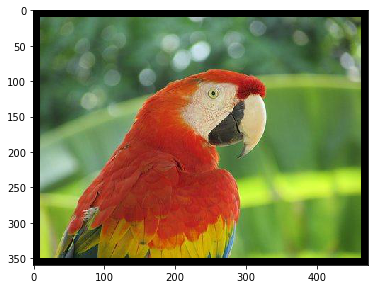

In [12]:
pad_size = [10, 10, 10, 10]
pad_image = padding_image(image, Type = "zero", pad_size = pad_size)
cv2.imwrite(output_path + "\\" + "padded_zero_" + image_name + ".png", cv2.cvtColor(pad_image, cv2.COLOR_RGB2BGR))
plt.figure(figsize = (6, 6))
plt.imshow(pad_image)

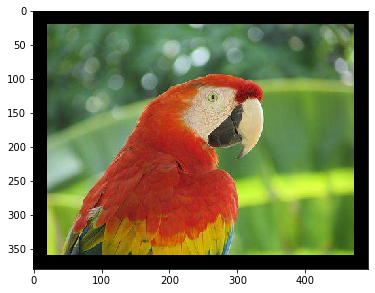

In [13]:
pad_size = [20, 20, 20, 20]
pad_image = padding_image(image, Type = "zero", pad_size = pad_size)
cv2.imwrite(output_path + "\\" + "padded_zero_" + image_name + ".png", cv2.cvtColor(pad_image, cv2.COLOR_RGB2BGR))
plt.figure(figsize = (6, 6))
plt.imshow(pad_image)

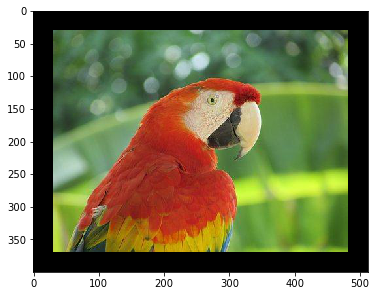

In [14]:
pad_size = [30, 30, 30, 30]
pad_image = padding_image(image, Type = "zero", pad_size = pad_size)
cv2.imwrite(output_path + "\\" + "padded_zero_" + image_name + ".png", cv2.cvtColor(pad_image, cv2.COLOR_RGB2BGR))
plt.figure(figsize = (6, 6))
plt.imshow(pad_image)

##### Example 2 Contsant pad

In [15]:
image_name = "hill"

In [16]:
image = cv2.imread(input_path + "\\" + image_name + ".png")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

Enter color scale, Three integer between 0 and 255 with space in between:: 120 0 0


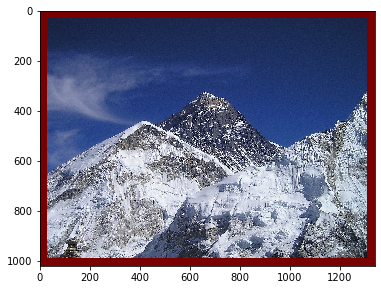

In [17]:
pad_size = [30, 30, 30, 30]
pad_image = padding_image(image, Type = "constant", pad_size = pad_size)
cv2.imwrite(output_path + "\\" + "padded_color_" + image_name + ".png", cv2.cvtColor(pad_image, cv2.COLOR_RGB2BGR))
plt.figure(figsize = (6, 6))
plt.imshow(pad_image)

##### Example 3 Clamp pad

In [18]:
image_name = "car"

In [19]:
image = cv2.imread(input_path + "\\" + image_name + ".jpg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

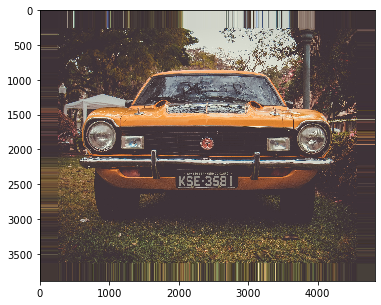

In [20]:
pad_size = [250, 250, 250, 250]
pad_image = padding_image(image, Type = "clamp", pad_size = pad_size)
cv2.imwrite(output_path + "\\" + "padded_clamp_" + image_name + ".png", cv2.cvtColor(pad_image, cv2.COLOR_RGB2BGR))
plt.figure(figsize = (6, 6))
plt.imshow(pad_image)

In [21]:
image_name = "sky"

In [22]:
image = cv2.imread(input_path + "\\" + image_name + ".jpg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

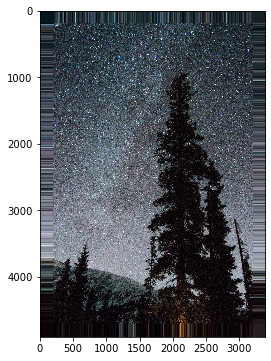

In [23]:
pad_size = [200, 200, 200, 200]
pad_image = padding_image(image, Type = "clamp", pad_size = pad_size)
cv2.imwrite(output_path + "\\" + "padded_clamp_" + image_name + ".png", cv2.cvtColor(pad_image, cv2.COLOR_RGB2BGR))
plt.figure(figsize = (6, 6))
plt.imshow(pad_image)

##### Example 4 Mirror pad

In [24]:
image_name = "car"

In [25]:
image = cv2.imread(input_path + "\\" + image_name + ".jpg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

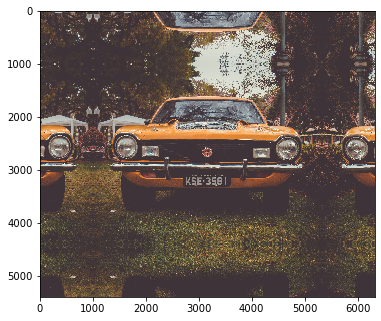

In [26]:
pad_size = [1000, 1000, 1000, 1000]
pad_image = padding_image(image, Type = "mirror", pad_size = pad_size)
cv2.imwrite(output_path + "\\" + "padded_mirror_" + image_name + ".png", cv2.cvtColor(pad_image, cv2.COLOR_RGB2BGR))
plt.figure(figsize = (6, 6))
plt.imshow(pad_image)

# 5.

#### Defining function

In [27]:
def convolution(image, vkernel, hkernel, print_kernel = False, pad_type = "zero"):
    kernel = np.outer(vkernel.ravel(), hkernel.ravel())
    kernel = kernel/kernel.sum()
    if print_kernel == True:
        return(np.round((kernel), 5))
    
    offset = int(len(hkernel) // 2)
    pad_size = [int((len(hkernel) - 1)/2) for i in range(4)]
    input_image = padding_image(image, Type = pad_type, pad_size = pad_size)
    
    height = input_image.shape[0]
    width = input_image.shape[1]
    
    finished_task = 0
    output_image =  []
    for x in range(offset, height - offset):
        temp_image = []
        for y in range(offset, width - offset):
            acc = [0, 0, 0]
            for a in range(len(kernel)):
                for b in range(len(kernel)):
                    xn = x + a - offset
                    yn = y + b - offset
                    pixel = input_image[xn, yn]
                    acc[0] += pixel[0] * kernel[a][b]
                    acc[1] += pixel[1] * kernel[a][b]
                    acc[2] += pixel[2] * kernel[a][b]
            temp_image.append([int(acc[0]), int(acc[1]), int(acc[2])])
            
        finished_task += 1
        display("Processing: {}%".format(round(((finished_task/(height - 2 * offset))*100), 3)))
        clear_output(wait = True)
        
        output_image.append(temp_image)
        
    output_image = np.array(output_image)
    return(output_image)

In [28]:
def get_kernel(Type, length):
    if length%2 == 0:
        print("Enter a kernel of odd size")
        return(None)
    if Type == "Box":
        return(np.array([1/length for i in range(length)]), np.array([1/length for i in range(length)]))
    if Type == "Gaussian":
        sigma = np.random.randint(1, 10)
        mean = 4*sigma
        normal_sample = np.random.normal(loc = mean, scale = sigma, size = int((length + 1)/2))
        normal_sample = np.sort(normal_sample)
        normal_sample = np.append(normal_sample,normal_sample[::-1][1:])
        return(np.array(normal_sample), np.array(normal_sample))
        

#### Testing function with examples

##### Example 1 Gausian kernel

Size = 3

In [29]:
h_k, v_k = get_kernel(Type = "Gaussian", length = 5)
print(convolution(None, vkernel = v_k, hkernel = h_k, print_kernel = True))

[[0.03089 0.03566 0.04267 0.03566 0.03089]
 [0.03566 0.04115 0.04925 0.04115 0.03566]
 [0.04267 0.04925 0.05893 0.04925 0.04267]
 [0.03566 0.04115 0.04925 0.04115 0.03566]
 [0.03089 0.03566 0.04267 0.03566 0.03089]]


Size = 7

In [30]:
h_k, v_k = get_kernel(Type = "Gaussian", length = 7)
print(convolution(None, vkernel = v_k, hkernel = h_k, print_kernel = True))

[[0.01504 0.01533 0.01875 0.02438 0.01875 0.01533 0.01504]
 [0.01533 0.01563 0.01912 0.02486 0.01912 0.01563 0.01533]
 [0.01875 0.01912 0.02338 0.03041 0.02338 0.01912 0.01875]
 [0.02438 0.02486 0.03041 0.03954 0.03041 0.02486 0.02438]
 [0.01875 0.01912 0.02338 0.03041 0.02338 0.01912 0.01875]
 [0.01533 0.01563 0.01912 0.02486 0.01912 0.01563 0.01533]
 [0.01504 0.01533 0.01875 0.02438 0.01875 0.01533 0.01504]]


##### Example 1 Box kernel

Size = 3

In [31]:
h_k, v_k = get_kernel(Type = "Box", length = 5)
print(convolution(None, vkernel = v_k, hkernel = h_k, print_kernel = True))

[[0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]]


Size = 7

In [32]:
h_k, v_k = get_kernel(Type = "Box", length = 7)
print(convolution(None, vkernel = v_k, hkernel = h_k, print_kernel = True))

[[0.02041 0.02041 0.02041 0.02041 0.02041 0.02041 0.02041]
 [0.02041 0.02041 0.02041 0.02041 0.02041 0.02041 0.02041]
 [0.02041 0.02041 0.02041 0.02041 0.02041 0.02041 0.02041]
 [0.02041 0.02041 0.02041 0.02041 0.02041 0.02041 0.02041]
 [0.02041 0.02041 0.02041 0.02041 0.02041 0.02041 0.02041]
 [0.02041 0.02041 0.02041 0.02041 0.02041 0.02041 0.02041]
 [0.02041 0.02041 0.02041 0.02041 0.02041 0.02041 0.02041]]


# 6.

#### Defining functions

Function to apply a kernel on an image given the image, kernel type, kernel size etc. It takes the kernel length as mandatory input. Eithher image name with the input folder path or an image and applies the filter. Default filter is set as Box. It can be changet to gaussian as "kernel_type" = "Gaussian"

In [33]:
def apply_kernel(kernel_length, image_name = None, image = False, input_path = input_path, jpg = False, kernel_type = "Box"):
    if not image:
        if jpg:
            image = cv2.imread(input_path + "\\" + image_name + ".jpg")
        else:
            image = cv2.imread(input_path + "\\" + image_name + ".png")
        
        image_pic = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    else:
        image_pic = image
    
    vkernel, hkernel = get_kernel(Type = kernel_type, length = kernel_length)
    convolved_image = convolution(image_pic, hkernel, vkernel)
    
    return(image_pic, convolved_image)

Function to sharpen an image. It It takes the original image not the name. Either blurred image or the kernel details (Type, size). Also takes the sharp amount, threshold and variance.

In [34]:
def sharpening_conv(image, blurred_image = None, blurred = True, amount = 2, jpg = False, kernel_length = 5, kernel_type = "Box"):
    if not blurred:
        _, blurred_image = apply_kernel(image = image, jpg = jpg, kernel_length = kernel_length, kernel_type = kernel_type)
    
    sharpened = image + amount * (image - blurred_image)
    sharpened = np.maximum(sharpened, np.zeros(sharpened.shape))
    sharpened = np.minimum(sharpened, 255 * np.ones(sharpened.shape))
    sharpened = sharpened.round().astype(np.uint8)
    
    return(sharpened)

#### Applying box kernel

###### Example 1

Applying Box kernel over hill image

In [95]:
image_name = "hill"

In [39]:
image, image_5 = apply_kernel(image_name = image_name, input_path = input_path, kernel_length = 5, kernel_type = "Box")
_, image_7 = apply_kernel(image_name = image_name, input_path = input_path, kernel_length = 7, kernel_type = "Box")
_, image_11 = apply_kernel(image_name = image_name, input_path = input_path, kernel_length = 11, kernel_type = "Box")

'Processing: 100.0%'

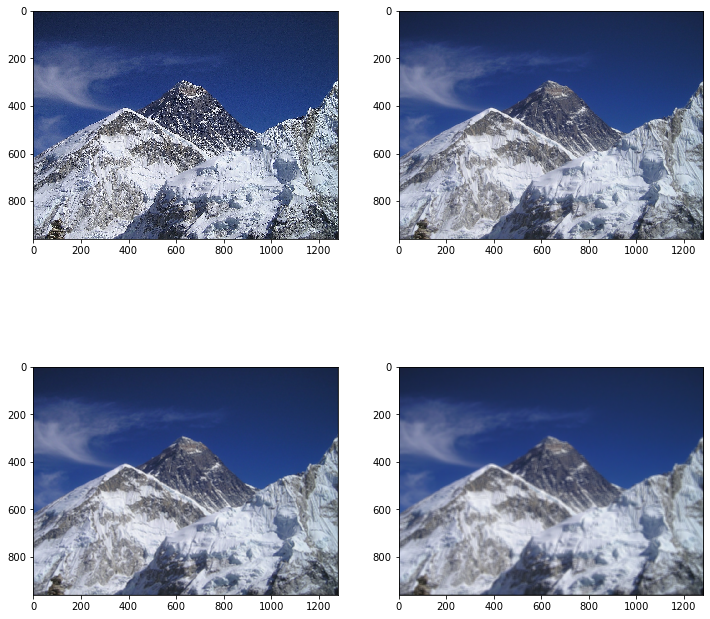

In [40]:
f, axarr = plt.subplots(2, 2, figsize=(12, 12))

axarr[0][0].imshow(image)
axarr[0][1].imshow(image_5)
axarr[1][0].imshow(image_7)
axarr[1][1].imshow(image_11)

Applying sharpening over the blurred image

In [41]:
image_5_sharp = sharpening_conv(image, blurred_image = image_5, amount = 2)
image_7_sharp = sharpening_conv(image, blurred_image = image_7, amount = 2)
image_11_sharp = sharpening_conv(image, blurred_image = image_11, amount = 0.3)

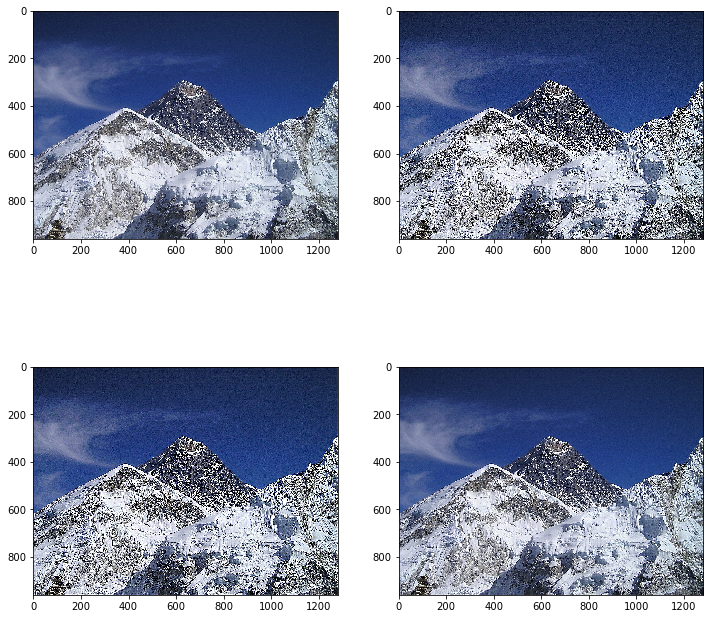

In [42]:
f, axarr = plt.subplots(2, 2, figsize=(12, 12))

axarr[0][0].imshow(image)
axarr[0][1].imshow(image_5_sharp)
axarr[1][0].imshow(image_7_sharp)
axarr[1][1].imshow(image_11_sharp)

##### Storing images

In [96]:
cv2.imwrite(output_path + "\\" + "sharpen_" + image_name + ".png", cv2.cvtColor(image_11_sharp, cv2.COLOR_RGB2BGR))

True

##### Example 2

Applying Box kernel over freckles image

In [43]:
image_name = "freckles"

In [44]:
image, image_5 = apply_kernel(image_name = image_name, kernel_length = 5, kernel_type = "Box", jpg = True)
_, image_7 = apply_kernel(image_name = image_name, kernel_length = 7, kernel_type = "Box", jpg = True)
_, image_11 = apply_kernel(image_name = image_name, kernel_length = 11, kernel_type = "Box", jpg = True)

'Processing: 100.0%'

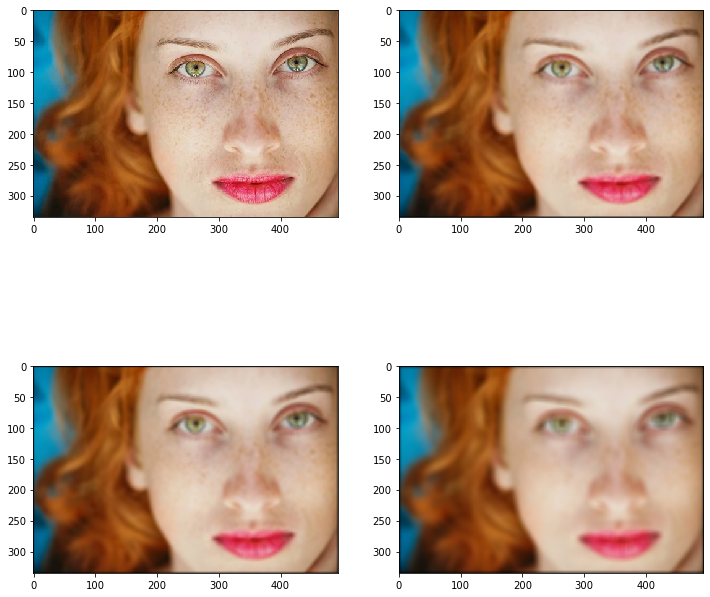

In [45]:
f, axarr = plt.subplots(2, 2, figsize=(12, 12))

axarr[0][0].imshow(image)
axarr[0][1].imshow(image_5)
axarr[1][0].imshow(image_7)
axarr[1][1].imshow(image_11)

Applying sharpening over the blurred image

In [46]:
image_5_sharp = sharpening_conv(image, blurred_image = image_5, amount = 5)
image_7_sharp = sharpening_conv(image, blurred_image = image_7, amount = 5)
image_11_sharp = sharpening_conv(image, blurred_image = image_11, amount = 5)

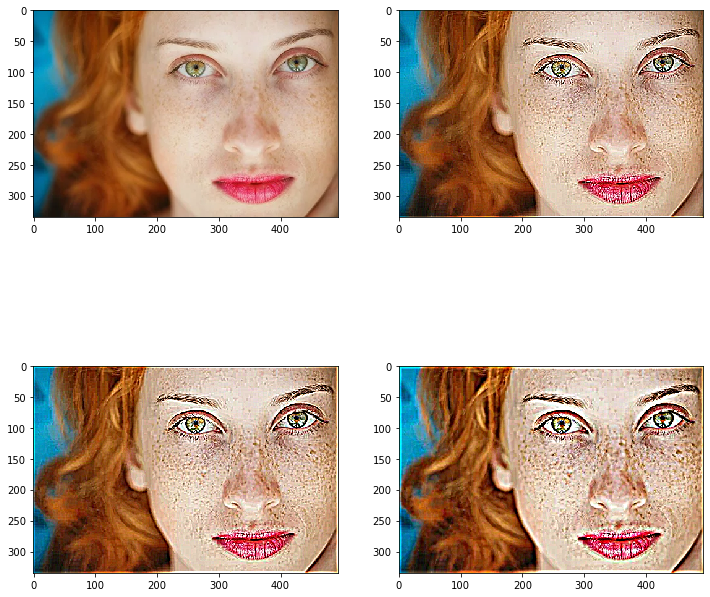

In [47]:
f, axarr = plt.subplots(2, 2, figsize=(12, 12))

axarr[0][0].imshow(image)
axarr[0][1].imshow(image_5_sharp)
axarr[1][0].imshow(image_7_sharp)
axarr[1][1].imshow(image_11_sharp)

##### Storing images

In [97]:
cv2.imwrite(output_path + "\\" + "sharpen_" + image_name + ".png", cv2.cvtColor(image_5_sharp, cv2.COLOR_RGB2BGR))

True

#### Applying gaussian kernel

Applying Gaussian kernel over freckles image

In [48]:
image_name = "freckles"

In [49]:
image, image_5 = apply_kernel(image_name = image_name, kernel_length = 5, kernel_type = "Gaussian", jpg = True)
_, image_7 = apply_kernel(image_name = image_name, kernel_length = 7, kernel_type = "Gaussian", jpg = True)
_, image_11 = apply_kernel(image_name = image_name, kernel_length = 11, kernel_type = "Gaussian", jpg = True)

'Processing: 100.0%'

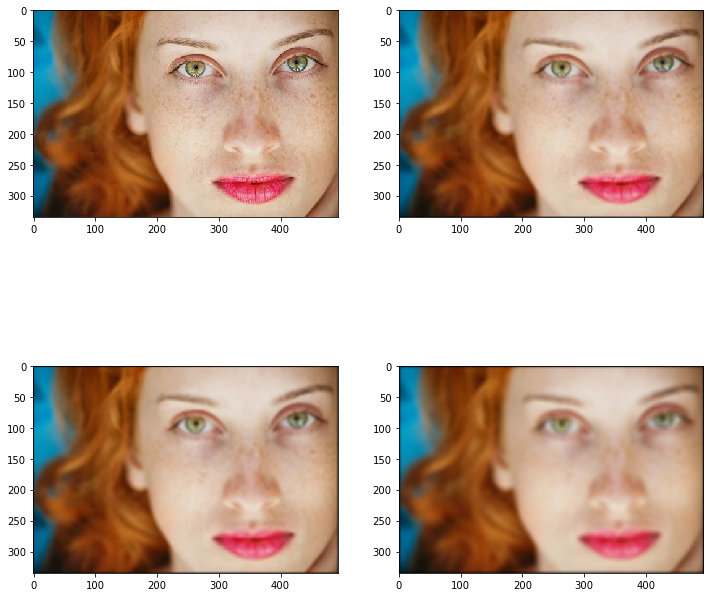

In [50]:
f, axarr = plt.subplots(2, 2, figsize=(12, 12))

axarr[0][0].imshow(image)
axarr[0][1].imshow(image_5)
axarr[1][0].imshow(image_7)
axarr[1][1].imshow(image_11)

Applying sharpening over the blurred image

In [51]:
image_5_sharp = sharpening_conv(image, blurred_image = image_5, amount = 5)
image_7_sharp = sharpening_conv(image, blurred_image = image_7, amount = 5)
image_11_sharp = sharpening_conv(image, blurred_image = image_11, amount = 5)

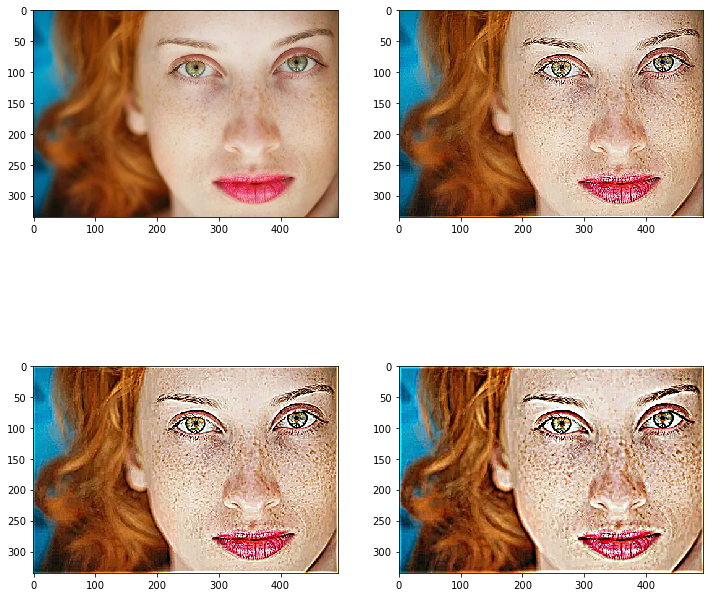

In [52]:
f, axarr = plt.subplots(2, 2, figsize=(12, 12))

axarr[0][0].imshow(image)
axarr[0][1].imshow(image_5_sharp)
axarr[1][0].imshow(image_7_sharp)
axarr[1][1].imshow(image_11_sharp)

##### Example 2

Applying Gaussian kernel over train image

In [79]:
image_name = "parrot"

In [81]:
image, image_5 = apply_kernel(image_name = image_name, kernel_length = 5, kernel_type = "Gaussian")
_, image_7 = apply_kernel(image_name = image_name, kernel_length = 7, kernel_type = "Gaussian")
_, image_11 = apply_kernel(image_name = image_name, kernel_length = 11, kernel_type = "Gaussian")

'Processing: 100.0%'

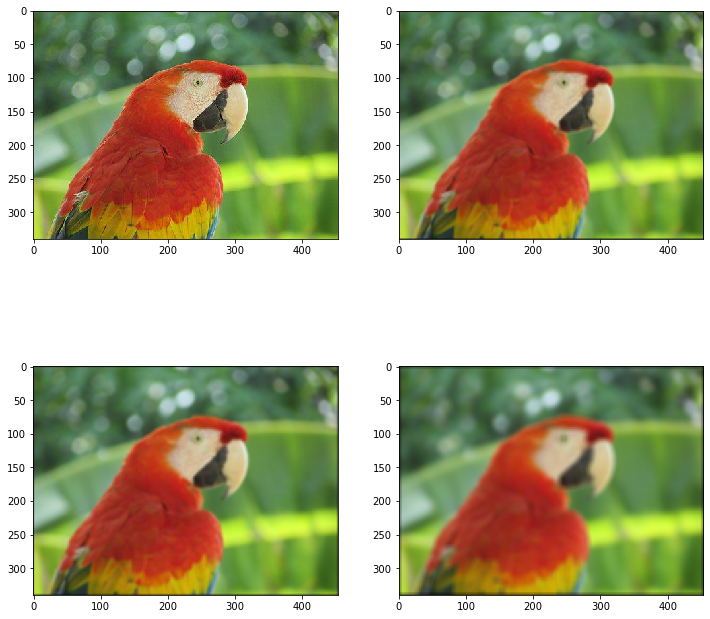

In [82]:
f, axarr = plt.subplots(2, 2, figsize=(12, 12))

axarr[0][0].imshow(image)
axarr[0][1].imshow(image_5)
axarr[1][0].imshow(image_7)
axarr[1][1].imshow(image_11)

Applying sharpening over the blurred image

In [85]:
image_5_sharp = sharpening_conv(image, blurred_image = image_5, amount = 2)
image_7_sharp = sharpening_conv(image, blurred_image = image_7, amount = 2)
image_11_sharp = sharpening_conv(image, blurred_image = image_11, amount = 2)

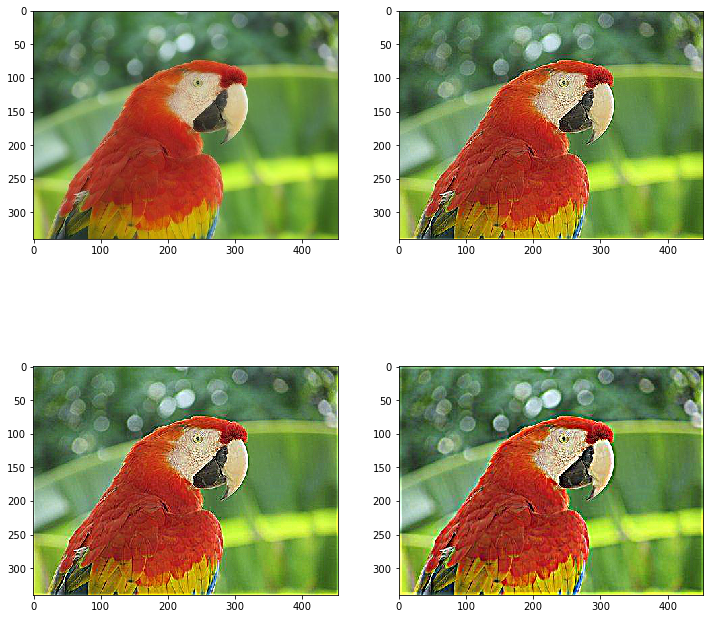

In [86]:
f, axarr = plt.subplots(2, 2, figsize=(12, 12))

axarr[0][0].imshow(image)
axarr[0][1].imshow(image_5_sharp)
axarr[1][0].imshow(image_7_sharp)
axarr[1][1].imshow(image_11_sharp)

# 7.

#### Defining function

In [3]:
def convolution_median(image, kernel_size = 5, pad_type = "zero"):
    vkernel = hkernel = np.array([1 for i in range(kernel_size)])
    kernel = np.outer(vkernel.ravel(), hkernel.ravel())    
    
    offset = int(kernel_size // 2)
    pad_size = [int((kernel_size - 1)/2) for i in range(4)]
    input_image = padding_image(image, Type = pad_type, pad_size = pad_size)
    
    height = input_image.shape[0]
    width = input_image.shape[1]
    
    finished_task = 0
  
    output_image =  []
    for x in range(offset, height - offset):
        temp_image = []
        for y in range(offset, width - offset):
            acc = [[], [], []]
            for a in range(kernel_size):
                for b in range(kernel_size):
                    xn = x + a - offset
                    yn = y + b - offset
                    pixel = input_image[xn, yn]
                    acc[0].append(pixel[0] * kernel[a][b])
                    acc[1].append(pixel[1] * kernel[a][b])
                    acc[2].append(pixel[2] * kernel[a][b])
            temp_image.append([int(np.median(acc[0])), int(np.median(acc[1])), int(np.median(acc[2]))])
        
        finished_task += 1
        display("Processing: {}%".format(round(((finished_task/(height - 2 * offset))*100), 3)))
        clear_output(wait = True)
        
        output_image.append(temp_image)
    
    output_image = np.array(output_image)
    return(output_image)

Function to sharpen an image using median filter. It takes the original image not the name. Either blurred image or the kernel details (Type, size). Also takes the sharp amount, threshold and variance.

In [4]:
def sharpening_median(image, blurred_image = None, blurred = True, amount = 2, jpg = False, kernel_length = 5, kernel_type = "Box"):
    if not blurred:
        _, blurred_image = apply_kernel_median(image = image, jpg = jpg, kernel_length = kernel_length, kernel_type = kernel_type)
    
    sharpened = blurred_image + amount * (image - blurred_image)
    sharpened = np.maximum(sharpened, np.zeros(sharpened.shape))
    sharpened = np.minimum(sharpened, 255 * np.ones(sharpened.shape))
    sharpened = sharpened.round().astype(np.uint8)
    
    return(sharpened)

Function to apply median kernel on an image given the image, kernel size etc. It takes the kernel length as mandatory input and an image and applies the filter.`

In [5]:
def apply_median_kernel(kernel_length, image_name = None, image = False, input_path = input_path, jpg = False):
    if not image:
        if jpg:
            image = cv2.imread(input_path + "\\" + image_name + ".jpg")
        else:
            image = cv2.imread(input_path + "\\" + image_name + ".png")
        
        image_pic = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    else:
        image_pic = image
    
    image_median = convolution_median(image_pic, kernel_size = kernel_length)
    return(image_pic, image_median)

#### Testing with examples

##### Example 1

Applying Median kernel over freckles image

In [61]:
image_name = "freckles"

In [62]:
image, image_5_med = apply_median_kernel(input_path = input_path, image_name = image_name, kernel_length = 5, jpg = True)
_, image_7_med = apply_median_kernel(input_path = input_path, image_name = image_name, kernel_length = 7, jpg = True)
_, image_11_med = apply_median_kernel(input_path = input_path, image_name = image_name, kernel_length = 11, jpg = True)

'Processing: 100.0%'

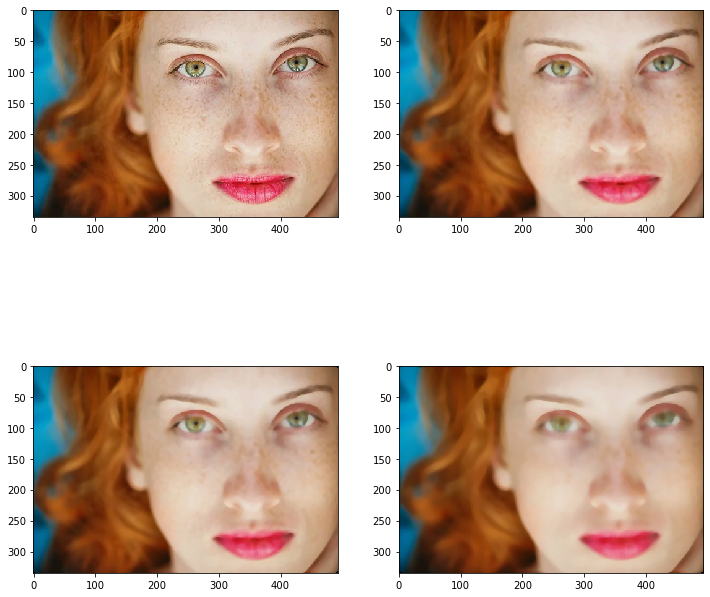

In [63]:
f, axarr = plt.subplots(2, 2, figsize=(12, 12))

axarr[0][0].imshow(image)
axarr[0][1].imshow(image_5_med)
axarr[1][0].imshow(image_7_med)
axarr[1][1].imshow(image_11_med)

Applying sharpening over the blurred image

In [64]:
image_5_med_sharp = sharpening_median(image, blurred_image = image_5_med, amount = 5)
image_7_med_sharp = sharpening_median(image, blurred_image = image_7_med, amount = 5)
image_11_med_sharp = sharpening_median(image, blurred_image = image_11_med, amount = 5)

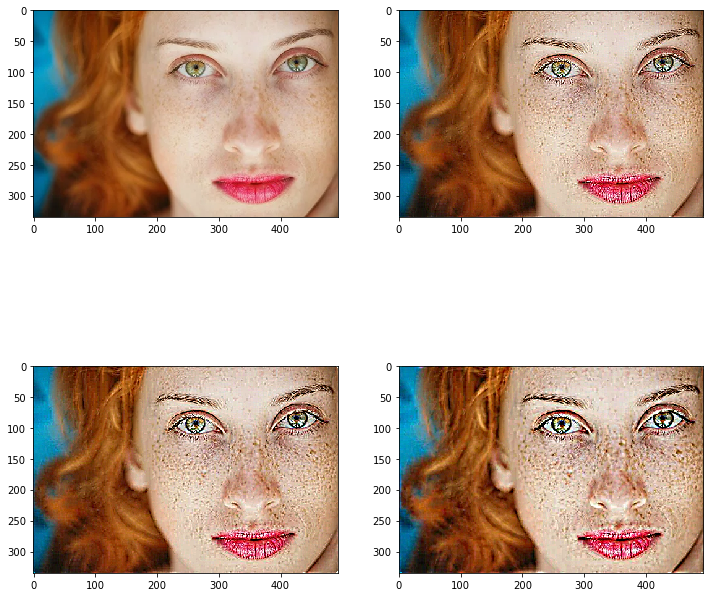

In [65]:
f, axarr = plt.subplots(2, 2, figsize=(12, 12))

axarr[0][0].imshow(image)
axarr[0][1].imshow(image_5_med_sharp)
axarr[1][0].imshow(image_7_med_sharp)
axarr[1][1].imshow(image_11_med_sharp)

##### Example 2

Applying Median kernel over train image

In [99]:
image_name = "train"

In [67]:
image, image_5_med = apply_median_kernel(input_path = input_path, image_name = image_name, kernel_length = 5, jpg = True)
_, image_7_med = apply_median_kernel(input_path = input_path, image_name = image_name, kernel_length = 7, jpg = True)
_, image_11_med = apply_median_kernel(input_path = input_path, image_name = image_name, kernel_length = 11, jpg = True)

'Processing: 100.0%'

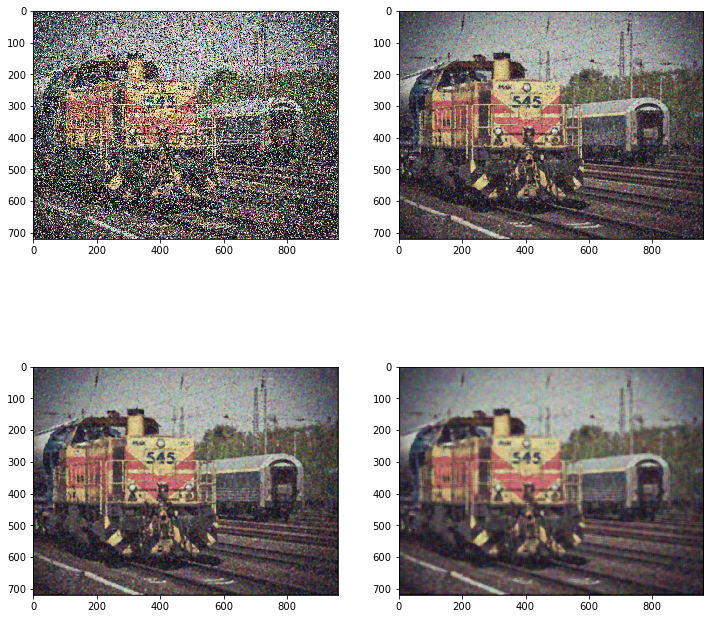

In [68]:
f, axarr = plt.subplots(2, 2, figsize=(12, 12))

axarr[0][0].imshow(image)
axarr[0][1].imshow(image_5_med)
axarr[1][0].imshow(image_7_med)
axarr[1][1].imshow(image_11_med)

Applying sharpening over the blurred image

In [71]:
image_5_med_sharp = sharpening_median(image, blurred_image = image_5_med, amount = 0.2)
image_7_med_sharp = sharpening_median(image, blurred_image = image_7_med, amount = 0.2)
image_11_med_sharp = sharpening_median(image, blurred_image = image_11_med, amount = 0.2)

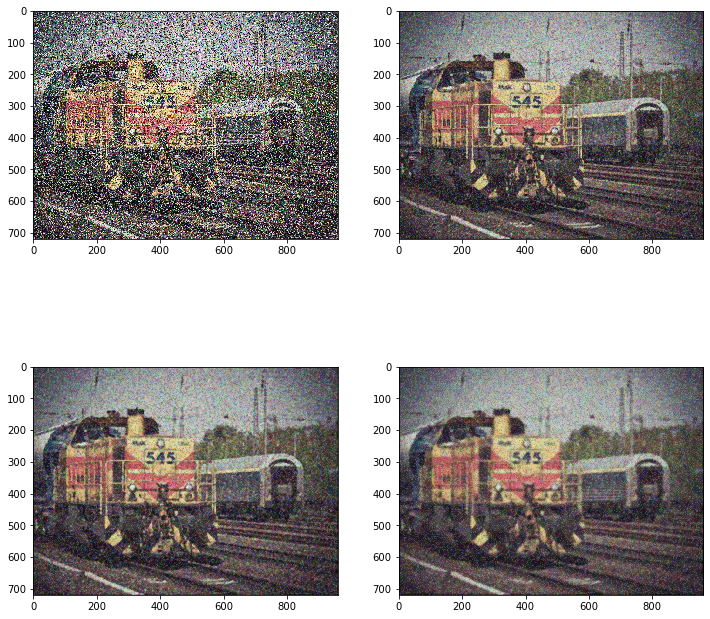

In [72]:
f, axarr = plt.subplots(2, 2, figsize=(12, 12))

axarr[0][0].imshow(image)
axarr[0][1].imshow(image_5_med_sharp)
axarr[1][0].imshow(image_7_med_sharp)
axarr[1][1].imshow(image_11_med_sharp)

# 8.

We can find that Box kernel is giving better blurring efftect. Kernel size vary image to image.

Gaussian kernel blur effect is less than box but it is capable of providing better sharpening effect. Again kernel size vary image to image.  

Median filter works best on images with noise. If there is no noise box and Gaussian is better. Sharpening of images using median filter is pretty bad.